<a href="https://colab.research.google.com/github/dkeum/GAN_MNIST/blob/main/GAN_MNIST.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch
from torch import nn

# Import torchvision
import torchvision
from torchvision import datasets
from torchvision.transforms import ToTensor
import torchvision.transforms as transforms


# Import matplotlib for visualization
import matplotlib.pyplot as plt


transforms= transforms.Compose(
    [transforms.ToTensor()]
)

# Setup training data
train_data = datasets.FashionMNIST(
    root="data", # where to download data to?
    train=True, # get training data
    download=True, # download data if it doesn't exist on disk
    transform=transforms, # images come as PIL format, we want to turn into Torch tensors
    target_transform=None # you can transform labels as well
)


# Setup testing data
test_data = datasets.FashionMNIST(
    root="data",
    train=False, # get test data
    download=True,
    transform=transforms
)




['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']
torch.Size([1, 28, 28])


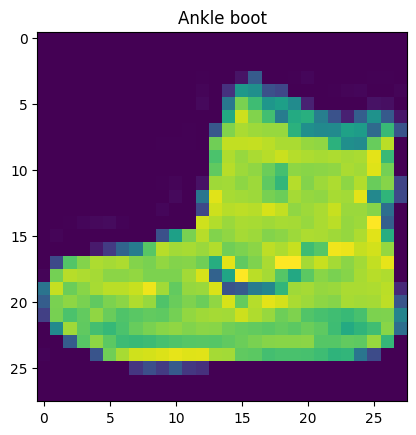

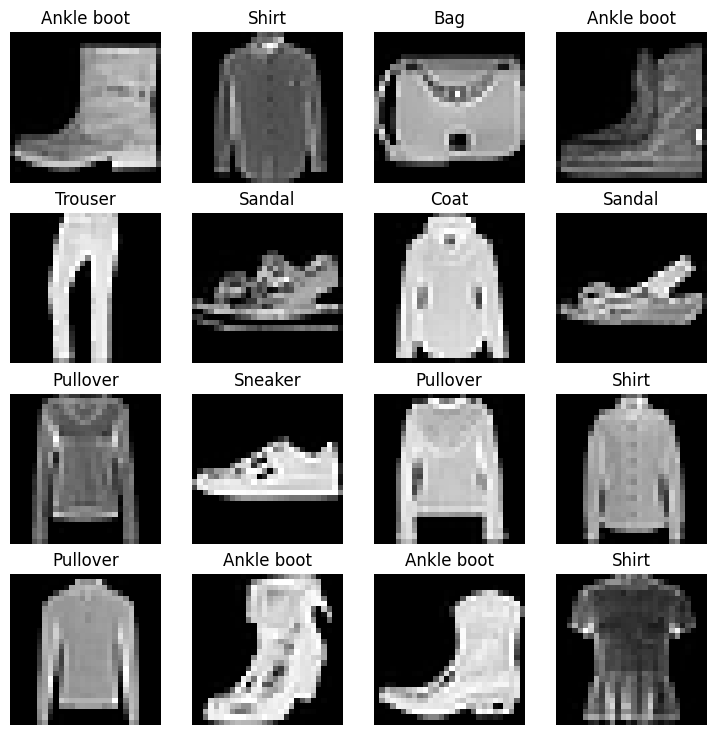

In [ ]:
class_names = train_data.classes
print(class_names)

import matplotlib.pyplot as plt
image, label = train_data[0]
print(image.shape)

plt.imshow(image.squeeze())
plt.title(class_names[label]);

torch.manual_seed(42)
fig = plt.figure(figsize=(9, 9))
rows, cols = 4, 4
for i in range(1,rows*cols+1):
  random_idx = torch.randint(0, len(train_data), size=[1]).item()
  image,label = train_data[random_idx]
  fig.add_subplot(rows, cols, i)
  plt.imshow(image.squeeze(), cmap='gray')
  plt.title(class_names[label])
  plt.axis(False)




In [ ]:
from torch.utils.data import DataLoader

# Setup the batch size hyperparameter
BATCH_SIZE = 32

train_dataloader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)
test_dataloader = DataLoader(test_data, batch_size=BATCH_SIZE, shuffle=True)

In [ ]:


# Batch size during training
batch_size = 64

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 28
# Number of channels in the training images. For color images this is 3
nc = 1
# Size of z latent vector (i.e. size of generator input)
nz = 100
# Size of feature maps in generator
ngf = 64
# Size of feature maps in discriminator
ndf = 64
# Beta1 hyperparameter for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

In [ ]:
from torch import nn
class Discriminator(nn.Module):
  def __init__(self, ngpu):
    super(Discriminator, self).__init__()
    self.ngpu = ngpu
    self.main= nn.Sequential(
          # 1 x 28 x 28 image, nc =1
          nn.Conv2d(nc, ndf, 4, 2, 3, bias=False),
          nn.LeakyReLU(0.2, inplace=True),
          # state size. ``(ndf) x 16 x 16
          nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
          nn.BatchNorm2d(ndf * 2),
          nn.LeakyReLU(0.2, inplace=True),
          # state size. ``(ndf*2) x 8 x 8``

          nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
          nn.BatchNorm2d(ndf * 4),
          nn.LeakyReLU(0.2, inplace=True),

          # state size. ``(ndf*4) x 4 x 4``
          nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
          nn.BatchNorm2d(ndf * 8),
          nn.LeakyReLU(0.2, inplace=True),
          # state size. ``(ndf*8) x  2x 2``
          nn.Conv2d(ndf * 8, 1, 2, 1, 0, bias=False),
          nn.Sigmoid()
        )
  def forward(self, x):
    return self.main(x)



class Generator(nn.Module):
    def __init__(self, ngpu=1):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution

            # 1 * 28 *28
            nn.ConvTranspose2d( nz, ngf * 4, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. ``(ngf*4) x 4 x 4``
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. ``(ngf*2) x 8 x 8``
            nn.ConvTranspose2d( ngf * 2, ngf * 1, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 1),
            nn.ReLU(True),
            # state size. ``(ngf*1) x 16 x 16``
            nn.ConvTranspose2d( ngf * 1, nc, 4, 2, padding=3 , bias=False),
            nn.Tanh()
            # state size. ``(nc) x 28 x 28``
        )

    def forward(self, input):
        return self.main(input)


# class Generator_V1(nn.Module):
#     def __init__(self, ngpu=1):
#         super(Generator_V1, self).__init__()
#         self.ngpu = ngpu
#         self.block1 = nn.Sequential(
#             # input is Z, going into a convolution
#             # 1 * 28 *28
#             nn.ConvTranspose2d( nz, ngf * 4, 4, 1, 0, bias=False),
#             nn.BatchNorm2d(ngf * 8),
#             nn.ReLU(True),
#             # state size. ``(ngf*4) x 4 x 4``
#             nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
#             nn.BatchNorm2d(ngf * 4),
#             nn.ReLU(True)
#         )
#         self.block2 = nn.Sequential(
#             # state size. ``(ngf*4) x 8 x 8``
#             nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
#             nn.BatchNorm2d(ngf * 2),
#             nn.ReLU(True),
#             # state size. ``(ngf*2) x 16 x 16``
#             nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
#             nn.BatchNorm2d(ngf),
#             nn.ReLU(True),
#             # state size. ``(ngf) x 32 x 32``
#             nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
#             nn.Tanh()
#             # state size. ``(nc) x 64 x 64``
#         )

#     def forward(self, x):
#         x = self.block1(x)
#         print(x)
#         x= self.block2(x)
#         print(x)
#         return x

# custom weights initialization called on ``netG`` and ``netD``
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)



```
# Testing the Generator Code for Dimension size 1x28x28
because the original pytorch code is in 3x64x64 images input.
```



In [ ]:
# test_Gen1 = Generator_V1(ngpu=1)

# image_set = torch.randn(64,1,28,28)
# test_image = image[0]
# conTranpose2d = nn.ConvTranspose2d( 28, 32 * 8, 4, 1, 0, bias=False)
# conTranpose2d(test_image.unsqueeze(dim=0).unsqueeze(dim=0))

temp_ngf = 64
# With square kernels and equal stride
m = nn.ConvTranspose2d(100, temp_ngf*4, 4, stride=1,padding=0, bias=False)

input = torch.randn(20, 100, 1, 1)
output = m(input)
print(output.shape) # torch.Size([20, 1024, 4, 4])

m = nn.ConvTranspose2d(temp_ngf*4, temp_ngf*2, 4, stride=2,padding=1, bias=False)
output = m(output)
print(output.shape) # torch.Size([20, 512, 8, 8])

m = nn.ConvTranspose2d(temp_ngf*2, temp_ngf*1, 4, stride=2,padding=1, bias=False)
output = m(output)
print(output.shape) # torch.Size([20, 256, 16, 16])


m = nn.ConvTranspose2d(temp_ngf*1, 1, 4, stride=2,padding=3, bias=False)
output = m(output)
print(output.shape) # torch.Size([20, 128, 32, 32])

# m = nn.ConvTranspose2d(temp_ngf*2, 1, 4, stride=2,padding=1, bias=False)
# output = m(output)
# print(output.shape) # torch.Size([20, 1, 28, 28])

# test_Gen1 = Generator_V1(ngpu=1)

# image_set = torch.randn(64,1,28,28)
# test_image = image[0]
# conTranpose2d = nn.ConvTranspose2d( 28, 32 * 8, 4, 1, 0, bias=False)
# conTranpose2d(test_image.unsqueeze(dim=0).unsqueeze(dim=0))
# import torch
# m  = Generator(ngpu=1)

# input = torch.randn(20, 100, 1, 1)
# output = m(input)
# print(output.shape)

# import matplotlib.pyplot as plt

# image= output[0]
# plt.imshow(image.detach().numpy().squeeze() ,cmap='gray')




torch.Size([20, 256, 4, 4])
torch.Size([20, 128, 8, 8])
torch.Size([20, 64, 16, 16])
torch.Size([20, 1, 28, 28])


In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
# hyper parameters
lr= 3e-4
z_dim = 100
img_dim = 28*28*1
batch_size= 64
num_epochs= 10

criterion = nn.BCELoss()

discriminator = Discriminator(ngpu=1).to(device)
discriminator.apply(weights_init)
generator = Generator(ngpu=1).to(device)
generator.apply(weights_init)
fixed_noise = torch.randn((batch_size,z_dim,1,1)).to(device)
real_label = 1.
fake_label = 0.

import torch.optim as optim
# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(discriminator.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(generator.parameters(), lr=lr, betas=(beta1, 0.999))

# print(fixed_noise, fixed_noise.shape)




import torchvision.utils as vutilsNow we finALLY GET INTO THE TRAINING LOOP

In [ ]:
import torchvision.utils as vutils
import numpy as np
import matplotlib.animation as animation
from IPython.display import HTML

img_list = []
G_losses = []
D_losses = []
iters = 0
print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
  for i, data in enumerate(train_dataloader, 0):
    discriminator.zero_grad()
    real_cpu = data[0].to(device)
    b_size = real_cpu.size(0)
    label = torch.full((b_size,), real_label, dtype=torch.float, device=device)

    # Forward pass real batch through D
    output = discriminator(real_cpu).view(-1)

    # Calculate loss on all-real batch
    errD_real = criterion(output, label)
    # Calculate gradients for D in backward pass
    errD_real.backward()
    D_x = output.mean().item()
    ## Train with all-fake batch
    # Generate batch of latent vectors
    noise = torch.randn(b_size, nz, 1, 1, device=device)
     # Generate fake image batch with G
    fake = generator(noise)
    label.fill_(fake_label)
    # Classify all fake batch with D
    output = discriminator(fake.detach()).view(-1)
    errD_fake = criterion(output, label)
    errD_fake.backward()
    D_G_z1 = output.mean().item()
    errD = errD_real + errD_fake
    optimizerD.step()

    generator.zero_grad()
    label.fill_(real_label)  # fake labels are real for generator cost
    # Since we just updated D, perform another forward pass of all-fake batch through D
    output = discriminator(fake).view(-1)
    # Calculate G's loss based on this output
    errG = criterion(output, label)
    # Calculate gradients for G
    errG.backward()
    D_G_z2 = output.mean().item()
    # Update G
    optimizerG.step()

     # Output training stats
    if i % 50 == 0:
        print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
              % (epoch, num_epochs, i, len(train_dataloader),
                  errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

    # Save Losses for plotting later
    G_losses.append(errG.item())
    D_losses.append(errD.item())

    # Check how the generator is doing by saving G's output on fixed_noise
    if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(train_dataloader)-1)):
        with torch.no_grad():
            fake = generator(fixed_noise).detach().cpu()
        img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

    iters += 1




Starting Training Loop...
[0/10][0/1875]	Loss_D: 1.5735	Loss_G: 3.3173	D(x): 0.6066	D(G(z)): 0.6326 / 0.0388
[0/10][50/1875]	Loss_D: 0.4809	Loss_G: 5.8989	D(x): 0.8277	D(G(z)): 0.1722 / 0.0042
[0/10][100/1875]	Loss_D: 0.0888	Loss_G: 4.5565	D(x): 0.9567	D(G(z)): 0.0419 / 0.0140
[0/10][150/1875]	Loss_D: 0.6217	Loss_G: 2.7077	D(x): 0.6126	D(G(z)): 0.0266 / 0.1249
[0/10][200/1875]	Loss_D: 0.2059	Loss_G: 4.0834	D(x): 0.8935	D(G(z)): 0.0752 / 0.0288
[0/10][250/1875]	Loss_D: 0.1608	Loss_G: 3.8748	D(x): 0.9199	D(G(z)): 0.0673 / 0.0268
[0/10][300/1875]	Loss_D: 0.1240	Loss_G: 4.6953	D(x): 0.9668	D(G(z)): 0.0813 / 0.0133
[0/10][350/1875]	Loss_D: 1.1481	Loss_G: 9.9742	D(x): 0.9924	D(G(z)): 0.5804 / 0.0006
[0/10][400/1875]	Loss_D: 0.2129	Loss_G: 4.8675	D(x): 0.9593	D(G(z)): 0.1432 / 0.0119
[0/10][450/1875]	Loss_D: 0.0669	Loss_G: 6.6824	D(x): 0.9406	D(G(z)): 0.0030 / 0.0020
[0/10][500/1875]	Loss_D: 0.0449	Loss_G: 6.1951	D(x): 0.9785	D(G(z)): 0.0222 / 0.0035
[0/10][550/1875]	Loss_D: 0.5664	Loss_G: 8.

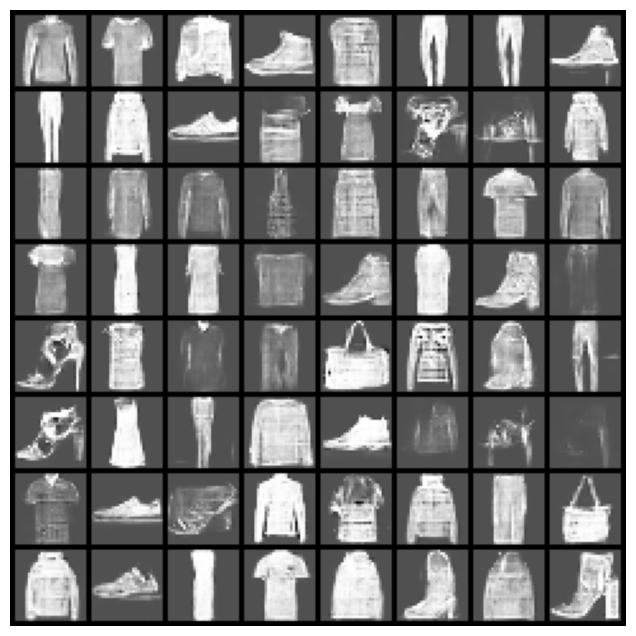

In [ ]:
    fig = plt.figure(figsize=(8,8))
    plt.axis("off")
    ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
    ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

    HTML(ani.to_jshtml())